In [1]:
# create offset

# load a latent

# apply offset

# plot it

In [2]:
# import what we need
%matplotlib inline
import argparse
import math
import os

import torch
from torch import optim
from torch.nn import functional as F
from torchvision import transforms
from PIL import Image
from tqdm import tqdm
import IPython.display
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from model import Generator

In [3]:
# helper functions
def make_image(tensor):
    return (
        tensor.detach()
        .clamp_(min=-1, max=1)
        .add(1)
        .div_(2)
        .mul(255)
        .type(torch.uint8)
        .permute(0, 2, 3, 1)
        .to("cpu")
        .numpy()
    )

In [4]:
# load the model

model_checkpoint = "/afs/csail.mit.edu/u/v/vmreyes/models/movie512.pt"
ckpt_channel_multiplier = 1
generator_dim = 512
device = "cuda"
frame_width = 1880
frame_height = 940


g_ema = Generator(generator_dim, 512, 8, channel_multiplier=ckpt_channel_multiplier)
g_ema.load_state_dict(torch.load(model_checkpoint)["g_ema"], strict=False)
g_ema.eval()
g_ema = g_ema.to(device)
noises_single = g_ema.make_noise()
noises = []
for noise in noises_single:
    noises.append(noise.repeat(1, 1, 1, 1).normal_())

In [155]:
# load a latent

frame_num = "00275"

target_latent = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-running-10/latents/" + \
                "lw-" + frame_num + "-15000-steps.pt"

projected_result = torch.load(target_latent)
#print(projected_result)
#latent = projected_result['scenes/little_women/frames/dialogue/lw-' + frame_num + '.png']['latent']
#latent.requires_grad = False
print(projected_result.keys())
latent = latent1
noise = projected_result['scenes/little_women/frames/running_interpolate10/lw-' + frame_num + '.png']['noise'] # TODO(vmreyes): noise is being saved as a 0,1,X,X dim tensor
img = projected_result['scenes/little_women/frames/running_interpolate10/lw-' + frame_num + '.png']['img']

dict_keys(['scenes/little_women/frames/running_interpolate10/lw-00275.png'])


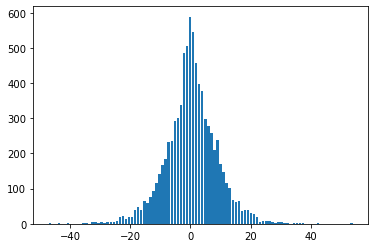

In [156]:
def print_histogram_of_latent(latent, bins=100):
    calculated_hist = torch.histc(latent, bins=bins)
    x_axis = np.arange(latent.min().cpu(), latent.max().cpu(), (latent.max().cpu() - latent.min().cpu()) / bins)
    plt.bar(x_axis, calculated_hist.cpu())
print_histogram_of_latent(latent, 100)

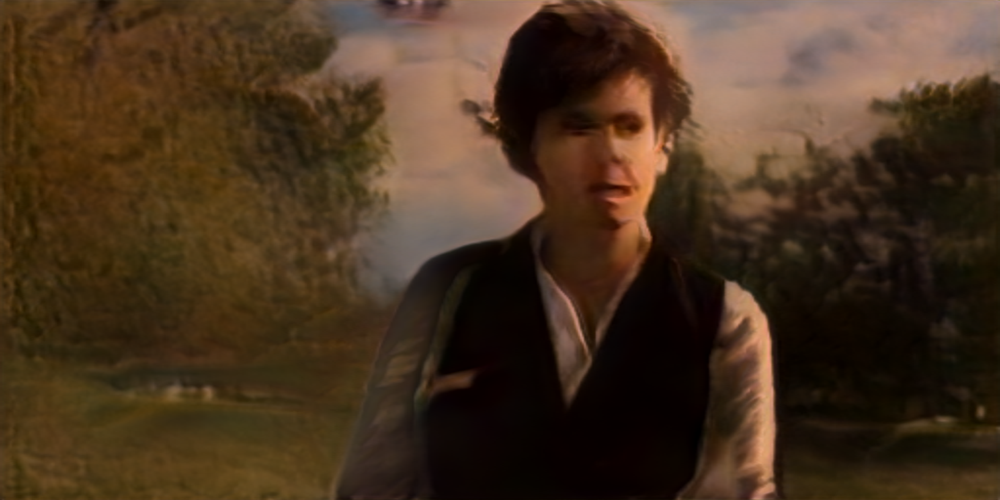

In [157]:
# show it
orig_img_gen, _ = g_ema(latent[None, None,:], input_is_latent=True, noise=noises)
original_img_ar = make_image(orig_img_gen)[0]
original_img = Image.fromarray(original_img_ar).resize((frame_width,frame_height))
IPython.display.display(original_img)


In [72]:
# load an offset
offset = torch.normal(torch.zeros(512), torch.ones(512)).to(device)

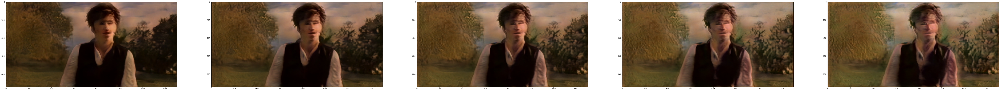

In [73]:
# load and apply an offset

layer = 11

_, axes = plt.subplots(1,5, figsize=(100,50))
for i in range(5):
    altered_latent = latent.detach().clone()
    altered_latent[layer] += i  * offset
    
    img_gen, _ = g_ema(altered_latent[None, None,:], input_is_latent=True, noise=noises)
    img_ar = make_image(img_gen)[0]
    new_img = np.asarray(Image.fromarray(img_ar).resize((frame_width,frame_height)))
    axes[i].imshow(new_img)

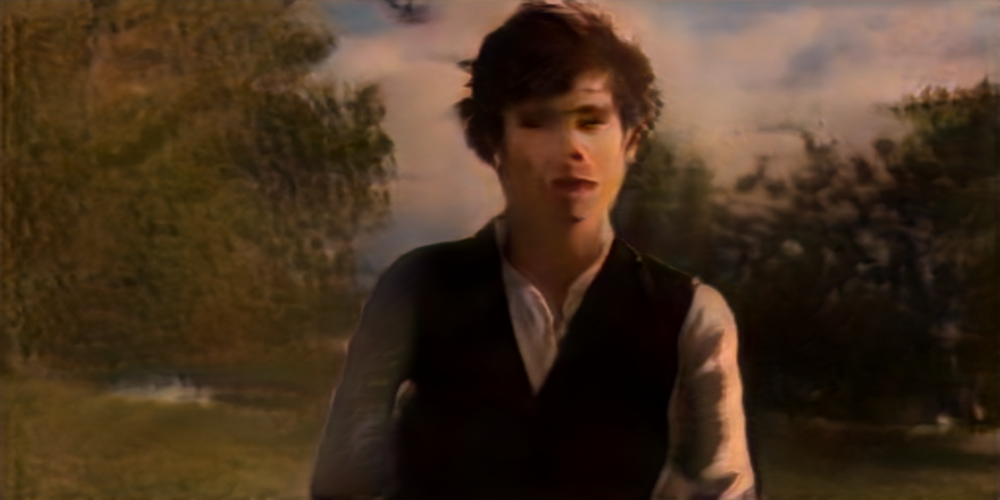

In [136]:
# load an opposing latent
#opposing_latent = "/data/vision/torralba/scratch/vmreyes/" + \
#                  "carol-full-reset-no-optimize-noise-5000-it-diff-loss/visualize-latent/full-alpha-0-1-5000-it/latents/" + \
#                  "carol-scene00300-0-reset-from-0-reset-till-15-layer-5000-steps.pt"

frame_num2 = "00212"

opposing_latent = "/data/vision/torralba/scratch/vmreyes/" + \
                "lw-full-reset-no-optimize-noise-5000-it-diff-loss/visualize-latent/dialogue-alpha-0-1-5000-it/latents/" + \
                "lw-" + frame_num_over_one + "-reset-from-0-reset-till-15-layer-5000-steps.pt"

opposing_result = torch.load(opposing_latent)
#opp_latent = opposing_result['scenes/carol_scene/frames/carol-scene00300-0.png']['latent']
#opp_latent = opposing_result['scenes/little_women/frames/dialogue/lw-' + frame_num_over_one + '.png']['latent']
opp_latent = latent2

opp_latent.requires_grad = False
img_gen, _ = g_ema(opp_latent[None, None,:], input_is_latent=True, noise=noises)
img_ar = make_image(img_gen)[0]
new_img = Image.fromarray(img_ar).resize((frame_width,frame_height))
IPython.display.display(new_img)

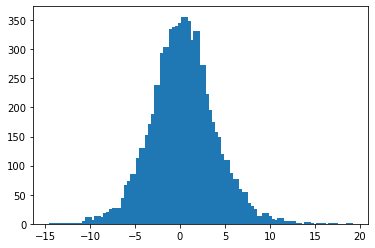

In [68]:
# print histogram
print_histogram_of_latent(opp_latent, 100)

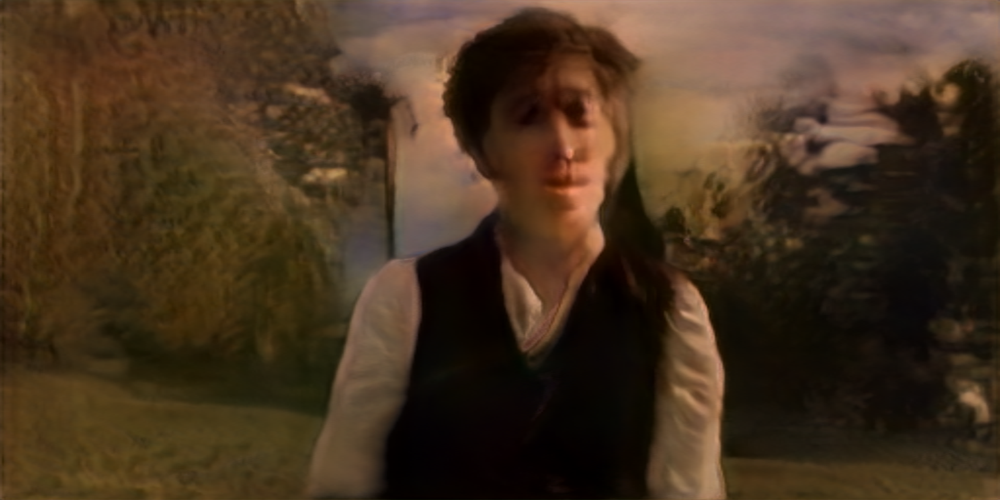

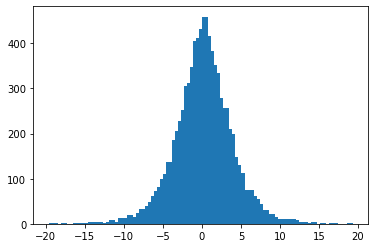

In [106]:
# style transfer

#layer 2 (1 0-indexed) seems to contain alot of positional information.
#resetting layers 2 to 6 almost convincingly moves the subject matter.
from_layer =0
to_layer =3

altered_latent = latent.detach().clone()
for i in range(from_layer, to_layer+1):
    altered_latent[i] = opp_latent[i].detach().clone()

print_histogram_of_latent(altered_latent, 100)
    
img_gen, _ = g_ema(altered_latent[None, None,:], input_is_latent=True, noise=noises)
img_ar = make_image(img_gen)[0]
new_img = Image.fromarray(img_ar).resize((frame_width,frame_height))
IPython.display.display(new_img)

0.0
0.25
0.5
0.75
1.0


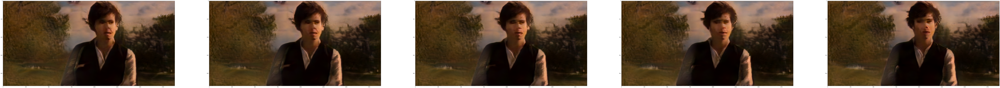

In [145]:
# change exaggerator

delta_latent = opp_latent - latent

_, axes = plt.subplots(1,5, figsize=(200,100))
for i in range(5):
    new_latent = latent + i * 0.25 * delta_latent
    print(i * 0.25)
    #print(new_latent[0])
    img_gen, _ = g_ema(new_latent[None, None,:], input_is_latent=True, noise=noises)
    img_ar = make_image(img_gen)[0]
    Image.fromarray(img_ar).resize((frame_width,frame_height)).save(str(i)+'.png')
    new_img = np.asarray(Image.fromarray(img_ar).resize((frame_width,frame_height)))
   # imshow(new_img)
    axes[i].imshow(new_img)

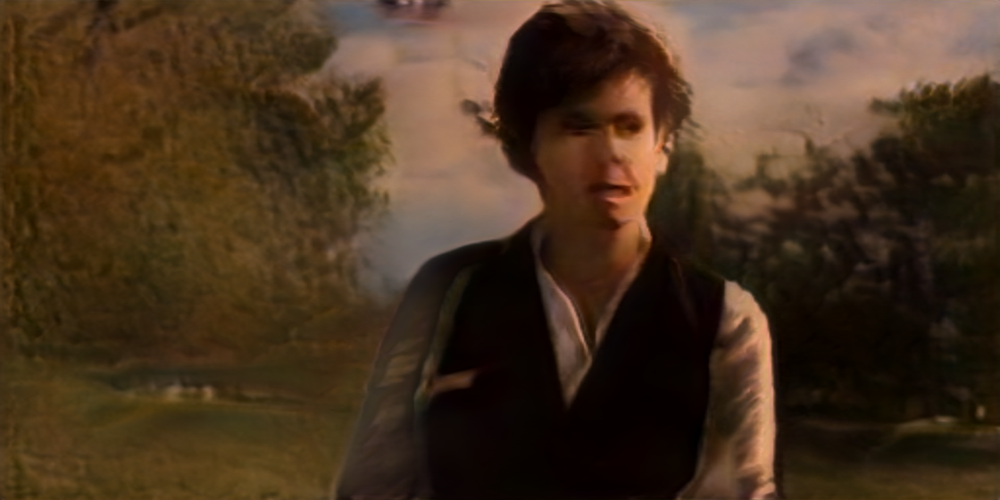

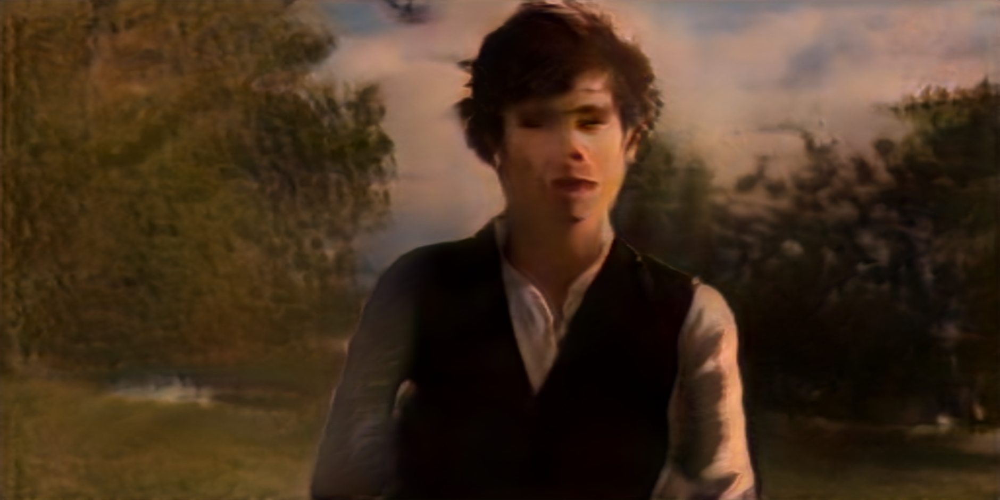

In [135]:
# load an interpolated latent file
file_num = "00200"
target_latent = "/data/vision/torralba/scratch/vmreyes/" + \
                "interpolated-loss/lw-stationary-dialogue/" + \
                "lw-" + file_num + "-15000-steps.pt"

projected_result = torch.load(target_latent)
#print(list(projected_result['scenes/little_women/frames/dialogue/lw-' + file_num + '.png'].keys()))

latent1 = projected_result['scenes/little_women/frames/dialogue/lw-' + file_num + '.png']['latent1']
latent1.requires_grad = False

latent2 = projected_result['scenes/little_women/frames/dialogue/lw-' + file_num + '.png']['latent2']
latent2.requires_grad = False

#noise = projected_result['scenes/little_women/frames/dialogue/lw-' + file_num + '.png']['noise'] # TODO(vmreyes): noise is being saved as a 0,1,X,X dim tensor
#img = projected_result['scenes/little_women/frames/dialogue/lw-' + frame_num + '.png']['img']

orig_img_gen, _ = g_ema(latent1[None, None,:], input_is_latent=True, noise=noises)
original_img_ar = make_image(orig_img_gen)[0]
original_img = Image.fromarray(original_img_ar).resize((frame_width,frame_height))
IPython.display.display(original_img)

orig_img_gen, _ = g_ema(latent2[None, None,:], input_is_latent=True, noise=noises)
original_img_ar = make_image(orig_img_gen)[0]
original_img = Image.fromarray(original_img_ar).resize((frame_width,frame_height))
IPython.display.display(original_img)